# Sample Integration and Comparative Analysis

This notebook demonstrates a comprehensive workflow for integrating and comparing spatial transcriptomics samples:
- Creating a mock **cancerous (mutated)** sample from healthy tissue
- Sample integration using Harmony
- **Cell type annotation with CellTypist**
- Per-cell-type differential expression analysis (DEGs)
- Per-cell-type gene set enrichment analysis (GSEA) with KEGG pathways
- Cell type proportion comparison between conditions
- Healthy vs Cancerous spatial visualization

**Author:** Generated for ST Course  
**Input Data:** adult_mouse_brain_ST4k.h5ad

## Workflow Overview:
1. Load Original Sample and Create Mock Cancerous Sample
2. Quality Control and Preprocessing
3. Sample Integration with Harmony
4. Cell Type Annotation with CellTypist
5. Differential Expression Analysis per Cell Type
6. Gene Set Enrichment Analysis (GSEA) per Cell Type
7. Cell Type Proportion Comparison
8. Spatial Visualization of Treatment Effects
9. Summary and Export

## 1. Setup and Configuration

In [1]:
# Install required packages
!pip install -q scanpy harmonypy gseapy celltypist leidenalg python-igraph scipy scikit-learn adjustText

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.1/45.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.3/605.3 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 64.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 79.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.6/176.6 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 83.0 MB/s eta 0:00:00


In [2]:
# Core libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import warnings
from scipy import stats
from scipy.sparse import issparse, csr_matrix
from matplotlib.patches import Patch

# Single-cell and spatial analysis
import scanpy as sc
import anndata as ad

# Batch correction
import harmonypy as hm

# Cell type annotation
import celltypist
from celltypist import models

# Gene set enrichment
import gseapy as gp

# Configure settings
warnings.filterwarnings('ignore')
sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=False)
sc.logging.print_header()

# Reproducibility
np.random.seed(42)

print(f"\nPackage versions:")
print(f"  Scanpy: {sc.__version__}")
print(f"  AnnData: {ad.__version__}")
print(f"  CellTypist: {celltypist.__version__}")
print(f"  GSEApy: {gp.__version__}")
print(f"  Harmonypy: {hm.__version__}")

/usr/local/lib/python3.12/dist-packages/celltypist/classifier.py:11: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  from scanpy import __version__ as scv



Package versions:
  Scanpy: 1.12
  AnnData: 0.12.10
  CellTypist: 1.7.1
  GSEApy: 1.1.11
  Harmonypy: 0.2.0


In [3]:
# Consistent color scheme for all plots
COLORS = {
    'control': '#3A86FF',      # Blue for healthy/control
    'treated': '#FF006E',      # Pink for cancerous/mutated
    'upregulated': '#E63946',  # Red for upregulated genes
    'downregulated': '#457B9D',# Blue for downregulated genes
    'neutral': '#B1B1B1',      # Gray for non-significant
    'dark_gray': '#4A4A4A'
}

# Check if Arial is available, fall back to system default otherwise
available_fonts = [f.name for f in matplotlib.font_manager.fontManager.ttflist]
font_family = 'Arial' if 'Arial' in available_fonts else matplotlib.rcParams['font.family']
print(f"Using font: {font_family}")

# Clean publication-ready plot style
plt.rcParams.update({
    'figure.figsize': (10, 8),
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': False,
    'font.family': font_family,
    'font.size': 11,
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'legend.frameon': False
})

Using font: ['sans-serif']


## 2. Load Original Sample and Create Mock Cancerous Sample

We load the original healthy brain sample and create a mock **cancerous (mutated)** sample simulating:
- **Large-scale transcriptional changes** (25% of genes affected with strong fold changes)
- **Shifted spatial coordinates** (neighboring tissue slice)
- **Heavy batch effects** (sequencing depth, gene-specific technical variation)
- **Altered cell composition** (cancer causes differential cell survival/proliferation)

In [4]:
!pip install gdown
import gdown

url = "https://drive.google.com/uc?id=1lRM-tR1MMbtgyKXLqRzV2YxokweiNUMz"
data_path = "adult_mouse_brain_ST4k.h5ad"
gdown.download(url, data_path, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1lRM-tR1MMbtgyKXLqRzV2YxokweiNUMz
To: /content/adult_mouse_brain_ST4k.h5ad
100%|██████████| 5.71M/5.71M [00:00<00:00, 112MB/s]


'adult_mouse_brain_ST4k.h5ad'

In [5]:
# Load the original healthy brain sample
data_path = 'adult_mouse_brain_ST4k.h5ad'
adata_control = sc.read_h5ad(data_path)

print("ORIGINAL (HEALTHY) DATA LOADED")
print(f"  Spots: {adata_control.n_obs:,}")
print(f"  Genes: {adata_control.n_vars:,}")

# Label as healthy control
adata_control.obs['condition'] = 'Control'
adata_control.obs['batch'] = 'batch1'
adata_control.obs['sample'] = 'control'

ORIGINAL (HEALTHY) DATA LOADED
  Spots: 4,000
  Genes: 20,062


In [6]:
# ============================================================
# Create mock CANCEROUS sample with strong mutations
# ============================================================
print("CREATING MOCK CANCEROUS SAMPLE")

adata_treated = adata_control.copy()

# --- 1. Shift spatial coordinates (neighboring tissue slice) ---
coords = adata_treated.obsm['spatial'].copy()
coords[:, 0] += 80   # larger shift than typical replicate
coords[:, 1] += 50
coords[:, :2] += np.random.normal(0, 5, coords[:, :2].shape)  # more jitter
adata_treated.obsm['spatial'] = coords
print("  1. Spatial coordinates shifted")

# --- 2. Strong cancer-like gene expression changes (25% of genes) ---
n_genes = adata_treated.n_vars
n_affected = int(n_genes * 0.25)  # 25% of genes affected (cancer is aggressive)
affected_genes_idx = np.random.choice(n_genes, n_affected, replace=False)
n_up = n_affected // 2
upregulated_idx = affected_genes_idx[:n_up]
downregulated_idx = affected_genes_idx[n_up:]

# Get dense matrix for manipulation
if issparse(adata_treated.X):
    X_cancer = adata_treated.X.toarray()
else:
    X_cancer = adata_treated.X.copy()

# Apply STRONG fold changes (cancer-level dysregulation)
for idx in upregulated_idx:
    X_cancer[:, idx] *= np.random.uniform(3.0, 10.0)   # 3-10x upregulation
for idx in downregulated_idx:
    X_cancer[:, idx] *= np.random.uniform(0.02, 0.2)   # 5-50x downregulation

print(f"  2. Mutated {n_affected} genes ({len(upregulated_idx)} up, {len(downregulated_idx)} down)")

# --- 3. Heavy batch effects (different sequencing run) ---
depth_factor = np.random.uniform(0.6, 0.8)  # strong depth difference
X_cancer *= depth_factor

# Gene-specific batch effects on 50% of genes
n_batch_genes = int(n_genes * 0.50)
batch_genes_idx = np.random.choice(n_genes, n_batch_genes, replace=False)
for idx in batch_genes_idx:
    X_cancer[:, idx] *= np.random.uniform(0.5, 1.5)

# Spot-level noise
noise = np.random.normal(1.0, 0.1, X_cancer.shape)
X_cancer *= noise
X_cancer = np.maximum(X_cancer, 0)  # no negative counts

print(f"  3. Batch effects: depth={depth_factor:.2f}, {n_batch_genes} genes with technical bias")

# --- 4. Alter cell composition (cancer kills some spots, expands others) ---
# Remove 15% of spots randomly (cell death in cancer)
n_remove = int(adata_treated.n_obs * 0.15)
keep_mask = np.ones(adata_treated.n_obs, dtype=bool)
remove_idx = np.random.choice(adata_treated.n_obs, n_remove, replace=False)
keep_mask[remove_idx] = False

X_cancer = X_cancer[keep_mask]
adata_treated = adata_treated[keep_mask].copy()
adata_treated.X = csr_matrix(X_cancer)

print(f"  4. Removed {n_remove} spots (simulating cancer cell death), {adata_treated.n_obs} remain")

# Store ground truth info
adata_treated.var['is_affected'] = False
adata_treated.var.iloc[affected_genes_idx, adata_treated.var.columns.get_loc('is_affected')] = True
adata_treated.var['true_effect'] = 'none'
adata_treated.var.iloc[upregulated_idx, adata_treated.var.columns.get_loc('true_effect')] = 'up'
adata_treated.var.iloc[downregulated_idx, adata_treated.var.columns.get_loc('true_effect')] = 'down'

# Label as cancerous
adata_treated.obs['condition'] = 'Treated'
adata_treated.obs['batch'] = 'batch2'
adata_treated.obs['sample'] = 'treated'
adata_treated.obs_names = [name + '_cancer' for name in adata_treated.obs_names]

print(f"\nCancerous sample: {adata_treated.n_obs:,} spots, {adata_treated.n_vars:,} genes")

CREATING MOCK CANCEROUS SAMPLE
  1. Spatial coordinates shifted
  2. Mutated 5015 genes (2507 up, 2508 down)
  3. Batch effects: depth=0.68, 10031 genes with technical bias
  4. Removed 600 spots (simulating cancer cell death), 3400 remain

Cancerous sample: 3,400 spots, 20,062 genes


In [7]:
# Save the cancerous sample to disk
treated_path = 'adult_mouse_brain_ST4k_treated.h5ad'
adata_treated.write(treated_path)
print(f"Cancerous sample saved: {treated_path} ({os.path.getsize(treated_path) / (1024**2):.1f} MB)")

Cancerous sample saved: adult_mouse_brain_ST4k_treated.h5ad (13.4 MB)


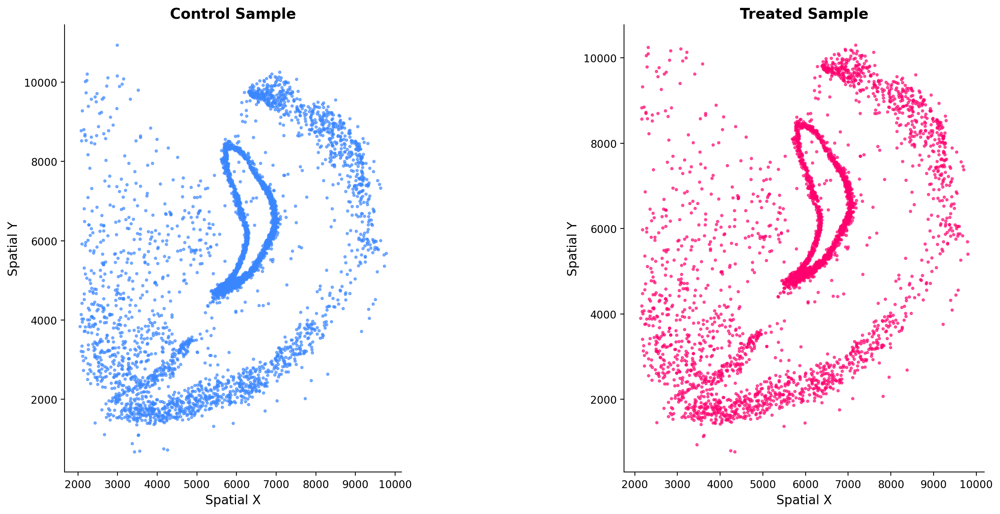

In [8]:
# Visualize both samples spatially
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for ax, adata, label, color in [
    (axes[0], adata_control, 'Control', COLORS['control']),
    (axes[1], adata_treated, 'Treated', COLORS['treated'])
]:
    coords = adata.obsm['spatial']
    ax.scatter(coords[:, 0], coords[:, 1], c=color, s=5, alpha=0.6)
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    ax.set_title(f'{label} Sample', fontweight='bold')
    ax.set_aspect('equal')

plt.tight_layout()
plt.show()

## 3. Quality Control, Preprocessing, and Integration

In [9]:
# Merge both samples into a single AnnData object
adata_combined = ad.concat([adata_control, adata_treated],
                           join='outer',
                           label='sample_id',
                           keys=['control', 'treated'])

# Propagate condition and batch labels from the 'sample' column
adata_combined.obs['condition'] = adata_combined.obs['sample'].astype(str).map(
    {'control': 'Control', 'treated': 'Treated'})
adata_combined.obs['batch'] = adata_combined.obs['sample'].astype(str).map(
    {'control': 'batch1', 'treated': 'batch2'})

print(f"Combined dataset: {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")
print(adata_combined.obs['condition'].value_counts())

Combined dataset: 7,400 spots, 20,062 genes
condition
Control    4000
Treated    3400
Name: count, dtype: int64


In [10]:
# --- Standard single-cell preprocessing pipeline ---

# Flag mitochondrial genes for QC
adata_combined.var['mt'] = adata_combined.var_names.str.startswith('mt-') | \
                           adata_combined.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata_combined, qc_vars=['mt'], percent_top=None,
                           log1p=False, inplace=True)

# Filter low-quality spots and rarely-detected genes
sc.pp.filter_cells(adata_combined, min_genes=200)
sc.pp.filter_genes(adata_combined, min_cells=3)

# Keep raw counts in a layer (needed for some DE methods)
adata_combined.layers['counts'] = adata_combined.X.copy()

# Normalize to 10,000 counts per spot, then log-transform
sc.pp.normalize_total(adata_combined, target_sum=1e4)
sc.pp.log1p(adata_combined)

# Store the full normalized matrix as .raw (used for DE later)
adata_combined.raw = adata_combined.copy()

# Select highly variable genes, accounting for batch
sc.pp.highly_variable_genes(adata_combined, n_top_genes=2000,
                            flavor='seurat', batch_key='batch')

print(f"After QC: {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")
print(f"HVGs selected: {adata_combined.var['highly_variable'].sum():,}")

After QC: 7,144 spots, 15,413 genes
HVGs selected: 2,000


In [11]:
# Dimensionality reduction on HVGs (before batch correction)
sc.tl.pca(adata_combined, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata_combined, min_dist=0.3)
print("PCA + UMAP computed (before Harmony integration)")

PCA + UMAP computed (before Harmony integration)


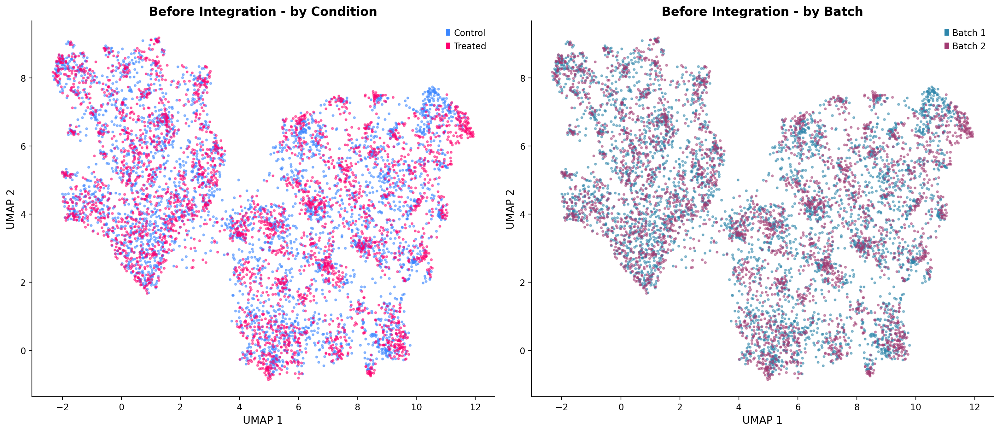

In [12]:
# Visualize before integration
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

condition_colors = {'Control': COLORS['control'], 'Treated': COLORS['treated']}
colors_cond = [condition_colors[c] for c in adata_combined.obs['condition']]

axes[0].scatter(adata_combined.obsm['X_umap'][:, 0],
               adata_combined.obsm['X_umap'][:, 1],
               c=colors_cond, s=5, alpha=0.5)
axes[0].set_xlabel('UMAP 1')
axes[0].set_ylabel('UMAP 2')
axes[0].set_title('Before Integration - by Condition', fontweight='bold')
axes[0].legend(handles=[Patch(facecolor=COLORS['control'], label='Control'),
                        Patch(facecolor=COLORS['treated'], label='Treated')])

batch_colors = {'batch1': '#2E86AB', 'batch2': '#A23B72'}
colors_batch = [batch_colors[b] for b in adata_combined.obs['batch']]

axes[1].scatter(adata_combined.obsm['X_umap'][:, 0],
               adata_combined.obsm['X_umap'][:, 1],
               c=colors_batch, s=5, alpha=0.5)
axes[1].set_xlabel('UMAP 1')
axes[1].set_ylabel('UMAP 2')
axes[1].set_title('Before Integration - by Batch', fontweight='bold')
axes[1].legend(handles=[Patch(facecolor='#2E86AB', label='Batch 1'),
                        Patch(facecolor='#A23B72', label='Batch 2')])

plt.tight_layout()
plt.show()

### Harmony Integration

Harmony removes batch effects in PCA space while preserving biological variation.

In [13]:
# Run Harmony batch correction on PCA coordinates
pca_coords = adata_combined.obsm['X_pca'].copy()
meta_data = adata_combined.obs[['batch']].copy()

harmony_out = hm.run_harmony(pca_coords, meta_data, 'batch',
                              max_iter_harmony=20, verbose=True)

# harmonypy v0.2+ returns PyTorch tensors - convert to numpy
Z = harmony_out.Z_corr
try:
    import torch
    if isinstance(Z, torch.Tensor):
        Z = Z.detach().cpu().numpy()
except ImportError:
    Z = np.asarray(Z)

# Ensure shape is (n_cells, n_pcs) regardless of library version
Z = np.asarray(Z)
n_cells = adata_combined.n_obs
X_harmony = Z.T if Z.shape[0] != n_cells else Z

adata_combined.obsm['X_pca_harmony'] = X_harmony
print(f"Harmony corrected PCs: {X_harmony.shape}")

2026-02-22 00:51:40,595 - harmonypy - INFO - Running Harmony (PyTorch on cpu)
INFO:harmonypy:Running Harmony (PyTorch on cpu)
2026-02-22 00:51:40,596 - harmonypy - INFO -   Parameters:
INFO:harmonypy:  Parameters:
2026-02-22 00:51:40,597 - harmonypy - INFO -     max_iter_harmony: 20
INFO:harmonypy:    max_iter_harmony: 20
2026-02-22 00:51:40,597 - harmonypy - INFO -     max_iter_kmeans: 20
INFO:harmonypy:    max_iter_kmeans: 20
2026-02-22 00:51:40,599 - harmonypy - INFO -     epsilon_cluster: 1e-05
INFO:harmonypy:    epsilon_cluster: 1e-05
2026-02-22 00:51:40,599 - harmonypy - INFO -     epsilon_harmony: 0.0001
INFO:harmonypy:    epsilon_harmony: 0.0001
2026-02-22 00:51:40,600 - harmonypy - INFO -     nclust: 100
INFO:harmonypy:    nclust: 100
2026-02-22 00:51:40,600 - harmonypy - INFO -     block_size: 0.05
INFO:harmonypy:    block_size: 0.05
2026-02-22 00:51:40,601 - harmonypy - INFO -     lamb: [1. 1.]
INFO:harmonypy:    lamb: [1. 1.]
2026-02-22 00:51:40,603 - harmonypy - INFO -    

Harmony corrected PCs: (7144, 50)


In [14]:
# Rebuild neighborhood graph and UMAP using Harmony-corrected PCs
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca_harmony')
sc.tl.umap(adata_combined, min_dist=0.3)

# Save the post-integration UMAP separately for comparison plots
adata_combined.obsm['X_umap_harmony'] = adata_combined.obsm['X_umap'].copy()
print("Post-integration UMAP computed")

Post-integration UMAP computed


In [15]:
# Cluster spots on the integrated embedding
sc.tl.leiden(adata_combined, resolution=0.5, key_added='leiden_harmony')

print(f"Found {adata_combined.obs['leiden_harmony'].nunique()} clusters:")
print(adata_combined.obs['leiden_harmony'].value_counts().sort_index())

Found 15 clusters:
leiden_harmony
0     1247
1      840
2      832
3      744
4      540
5      522
6      436
7      415
8      336
9      265
10     259
11     243
12     203
13     167
14      95
Name: count, dtype: int64


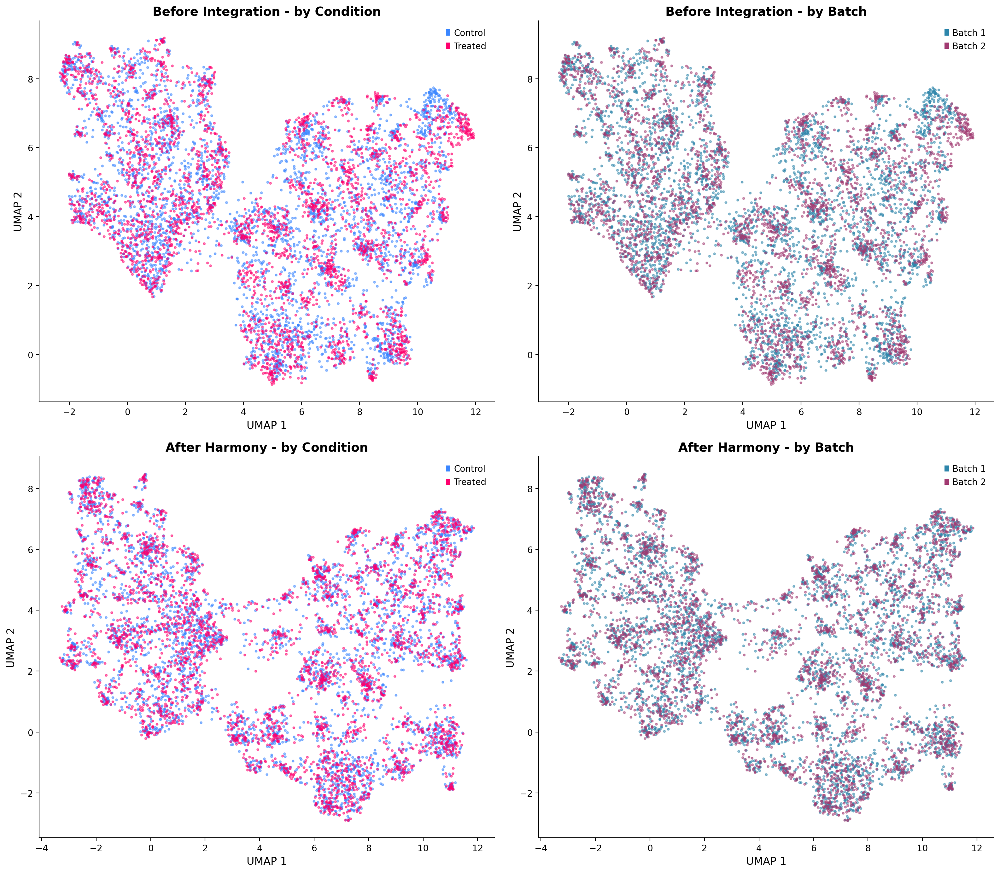

In [16]:
# Before/After integration comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

condition_colors_arr = [condition_colors[c] for c in adata_combined.obs['condition']]
batch_colors_arr = [batch_colors[b] for b in adata_combined.obs['batch']]

# Before integration
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca')
sc.tl.umap(adata_combined, min_dist=0.3)
umap_before = adata_combined.obsm['X_umap'].copy()

for ax, colors, title, legend in [
    (axes[0, 0], condition_colors_arr, 'Before Integration - by Condition',
     [Patch(facecolor=COLORS['control'], label='Control'),
      Patch(facecolor=COLORS['treated'], label='Treated')]),
    (axes[0, 1], batch_colors_arr, 'Before Integration - by Batch',
     [Patch(facecolor='#2E86AB', label='Batch 1'),
      Patch(facecolor='#A23B72', label='Batch 2')])
]:
    ax.scatter(umap_before[:, 0], umap_before[:, 1], c=colors, s=5, alpha=0.5)
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.set_title(title, fontweight='bold')
    ax.legend(handles=legend)

# After integration
umap_after = adata_combined.obsm['X_umap_harmony']

for ax, colors, title, legend in [
    (axes[1, 0], condition_colors_arr, 'After Harmony - by Condition',
     [Patch(facecolor=COLORS['control'], label='Control'),
      Patch(facecolor=COLORS['treated'], label='Treated')]),
    (axes[1, 1], batch_colors_arr, 'After Harmony - by Batch',
     [Patch(facecolor='#2E86AB', label='Batch 1'),
      Patch(facecolor='#A23B72', label='Batch 2')])
]:
    ax.scatter(umap_after[:, 0], umap_after[:, 1], c=colors, s=5, alpha=0.5)
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.set_title(title, fontweight='bold')
    ax.legend(handles=legend)

plt.tight_layout()
plt.show()

## 4. Cell Type Annotation with CellTypist

We use CellTypist with the `Mouse_Whole_Brain.pkl` model (334 cell types from the Allen Brain Atlas) to annotate cell types in the integrated dataset. Majority voting refines predictions using local neighborhood information.

In [17]:
# --- CellTypist annotation ---
# Ensure we use the Harmony-corrected neighbors for majority voting
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca_harmony')
adata_combined.obsm['X_umap'] = adata_combined.obsm['X_umap_harmony'].copy()

# Download the Mouse Whole Brain model (334 cell types, Allen Brain Atlas)
models.download_models(model='Mouse_Whole_Brain.pkl', force_update=False)

# Annotate: majority_voting smooths predictions using local neighborhoods
predictions = celltypist.annotate(
    adata_combined,
    model='Mouse_Whole_Brain.pkl',
    majority_voting=True
)
adata_combined = predictions.to_adata()

print(f"Annotated {adata_combined.obs['majority_voting'].nunique()} distinct cell types:")
print(adata_combined.obs['majority_voting'].value_counts().head(15))

Annotated 7 distinct cell types:
majority_voting
319 Astro-TE NN           3192
332 SMC NN                3082
318 Astro-NT NN            627
037 DG Glut                174
338 Lymphoid NN             27
331 Peri NN                 24
045 OB-STR-CTX Inh IMN      18
Name: count, dtype: int64


In [18]:
# Simplify labels: keep only the most abundant cell types, group the rest
top_n = 12
ct_counts = adata_combined.obs['majority_voting'].value_counts()
top_types = ct_counts.head(top_n).index.tolist()

adata_combined.obs['cell_type'] = adata_combined.obs['majority_voting'].apply(
    lambda x: x if x in top_types else 'Other'
)

print(f"Top {top_n} cell types + 'Other' = {adata_combined.obs['cell_type'].nunique()} categories:")
print(adata_combined.obs['cell_type'].value_counts())

Top 12 cell types + 'Other' = 7 categories:
cell_type
319 Astro-TE NN           3192
332 SMC NN                3082
318 Astro-NT NN            627
037 DG Glut                174
338 Lymphoid NN             27
331 Peri NN                 24
045 OB-STR-CTX Inh IMN      18
Name: count, dtype: int64


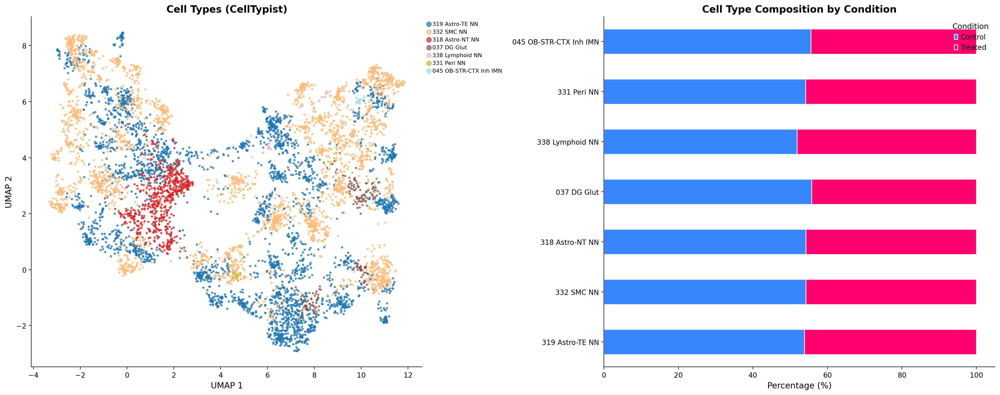

In [19]:
# UMAP colored by cell type
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Cell type UMAP
cell_types_unique = adata_combined.obs['cell_type'].value_counts().index.tolist()
n_types = len(cell_types_unique)
cmap = plt.cm.tab20(np.linspace(0, 1, max(n_types, 2)))
ct_color_map = {ct: cmap[i] for i, ct in enumerate(cell_types_unique)}

umap = adata_combined.obsm['X_umap_harmony']
for ct in cell_types_unique:
    mask = adata_combined.obs['cell_type'] == ct
    axes[0].scatter(umap[mask, 0], umap[mask, 1],
                   c=[ct_color_map[ct]], label=ct, s=5, alpha=0.7)

axes[0].set_xlabel('UMAP 1')
axes[0].set_ylabel('UMAP 2')
axes[0].set_title('Cell Types (CellTypist)', fontweight='bold')
axes[0].legend(markerscale=3, fontsize=8, loc='upper left', bbox_to_anchor=(1, 1))

# Cell type by condition
ct_cond = pd.crosstab(adata_combined.obs['cell_type'], adata_combined.obs['condition'],
                       normalize='index') * 100
ct_cond = ct_cond.loc[cell_types_unique]

ct_cond[['Control', 'Treated']].plot(
    kind='barh', stacked=True, ax=axes[1],
    color=[COLORS['control'], COLORS['treated']], edgecolor='white', linewidth=1)
axes[1].set_xlabel('Percentage (%)')
axes[1].set_ylabel('')
axes[1].set_title('Cell Type Composition by Condition', fontweight='bold')
axes[1].legend(title='Condition')

plt.tight_layout()
plt.show()

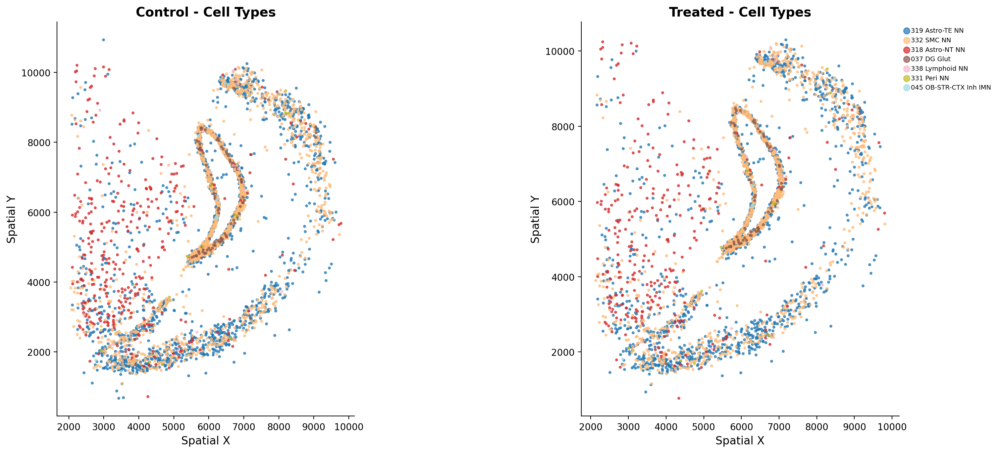

In [20]:
# Spatial visualization of cell types
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

for ax, cond, title in [(axes[0], 'Control', 'Control - Cell Types'),
                         (axes[1], 'Treated', 'Treated - Cell Types')]:
    mask = adata_combined.obs['condition'] == cond
    coords = adata_combined.obsm['spatial'][mask]
    ct_vals = adata_combined.obs.loc[mask, 'cell_type']

    for ct in cell_types_unique:
        ct_mask = ct_vals == ct
        if ct_mask.sum() > 0:
            ax.scatter(coords[ct_mask, 0], coords[ct_mask, 1],
                      c=[ct_color_map[ct]], label=ct, s=5, alpha=0.7)

    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    ax.set_title(title, fontweight='bold')
    ax.set_aspect('equal')

axes[1].legend(markerscale=3, fontsize=7, loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

## 5. Differential Expression Analysis per Cell Type

We perform Treated vs Control DE analysis within each cell type using Wilcoxon rank-sum test. The Control sample is used as reference.

In [21]:
# --- Differential expression: Cancerous vs Control within each cell type ---
pval_threshold = 0.05
logfc_threshold = 0.5
min_cells = 30  # skip cell types with fewer cells per condition

all_deg_results = {}
deg_summary = []

# Only test cell types with enough cells (skip 'Other')
cell_types_unique = adata_combined.obs['cell_type'].value_counts().index.tolist()
analysis_types = [ct for ct in cell_types_unique if ct != 'Other']

for ct in analysis_types:
    # Subset to this cell type
    mask = adata_combined.obs['cell_type'] == ct
    adata_sub = adata_combined[mask].copy()

    # Need enough cells in BOTH conditions
    counts_per_cond = adata_sub.obs['condition'].value_counts()
    if counts_per_cond.min() < min_cells:
        print(f"  Skipping {ct}: too few cells ({counts_per_cond.min()} < {min_cells})")
        continue

    # Wilcoxon rank-sum test (Treated vs Control)
    sc.tl.rank_genes_groups(
        adata_sub,
        groupby='condition',
        groups=['Treated'],
        reference='Control',
        method='wilcoxon',
        use_raw=True,
        key_added='de_condition'
    )

    # Extract results into a DataFrame
    df = sc.get.rank_genes_groups_df(adata_sub, group='Treated', key='de_condition')
    df['cell_type'] = ct
    df['-log10_pval'] = -np.log10(df['pvals_adj'] + 1e-300)

    # Classify regulation
    df['regulation'] = 'Not significant'
    df.loc[(df['pvals_adj'] < pval_threshold) & (df['logfoldchanges'] > logfc_threshold), 'regulation'] = 'Upregulated'
    df.loc[(df['pvals_adj'] < pval_threshold) & (df['logfoldchanges'] < -logfc_threshold), 'regulation'] = 'Downregulated'

    n_up = (df['regulation'] == 'Upregulated').sum()
    n_down = (df['regulation'] == 'Downregulated').sum()

    all_deg_results[ct] = df
    deg_summary.append({'cell_type': ct, 'n_up': n_up, 'n_down': n_down,
                        'n_total_deg': n_up + n_down, 'n_cells': adata_sub.n_obs})

    print(f"  {ct}: {n_up} up, {n_down} down ({adata_sub.n_obs} cells)")

deg_summary_df = pd.DataFrame(deg_summary).sort_values('n_total_deg', ascending=False)
print(f"\nDE complete for {len(all_deg_results)} cell types, "
      f"total DEGs: {deg_summary_df['n_total_deg'].sum()}")

  319 Astro-TE NN: 22 up, 60 down (3192 cells)
  332 SMC NN: 19 up, 51 down (3082 cells)
  318 Astro-NT NN: 4 up, 12 down (627 cells)
  037 DG Glut: 1 up, 8 down (174 cells)
  Skipping 338 Lymphoid NN: too few cells (13 < 30)
  Skipping 331 Peri NN: too few cells (11 < 30)
  Skipping 045 OB-STR-CTX Inh IMN: too few cells (8 < 30)

DE complete for 4 cell types, total DEGs: 177


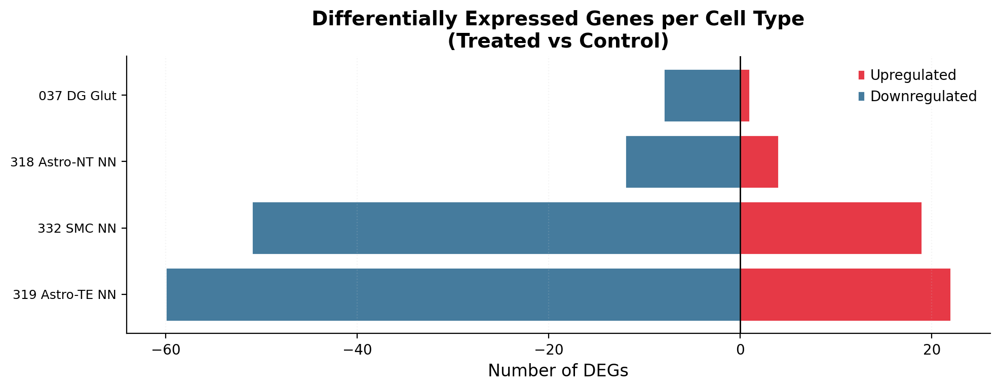

In [22]:
# DEG summary heatmap
fig, ax = plt.subplots(figsize=(10, max(4, len(deg_summary_df) * 0.5)))

summary_plot = deg_summary_df.set_index('cell_type')[['n_up', 'n_down']].copy()
summary_plot.columns = ['Upregulated', 'Downregulated']
summary_plot['Downregulated'] = -summary_plot['Downregulated']  # negative for visualization

y_pos = range(len(summary_plot))
ax.barh(y_pos, summary_plot['Upregulated'], color=COLORS['upregulated'],
        edgecolor='white', linewidth=1, label='Upregulated')
ax.barh(y_pos, summary_plot['Downregulated'], color=COLORS['downregulated'],
        edgecolor='white', linewidth=1, label='Downregulated')

ax.set_yticks(y_pos)
ax.set_yticklabels(summary_plot.index, fontsize=9)
ax.set_xlabel('Number of DEGs')
ax.set_title('Differentially Expressed Genes per Cell Type\n(Treated vs Control)', fontweight='bold')
ax.axvline(x=0, color='black', linewidth=1)
ax.legend()
ax.grid(True, alpha=0.2, axis='x', linestyle=':')

plt.tight_layout()
plt.show()

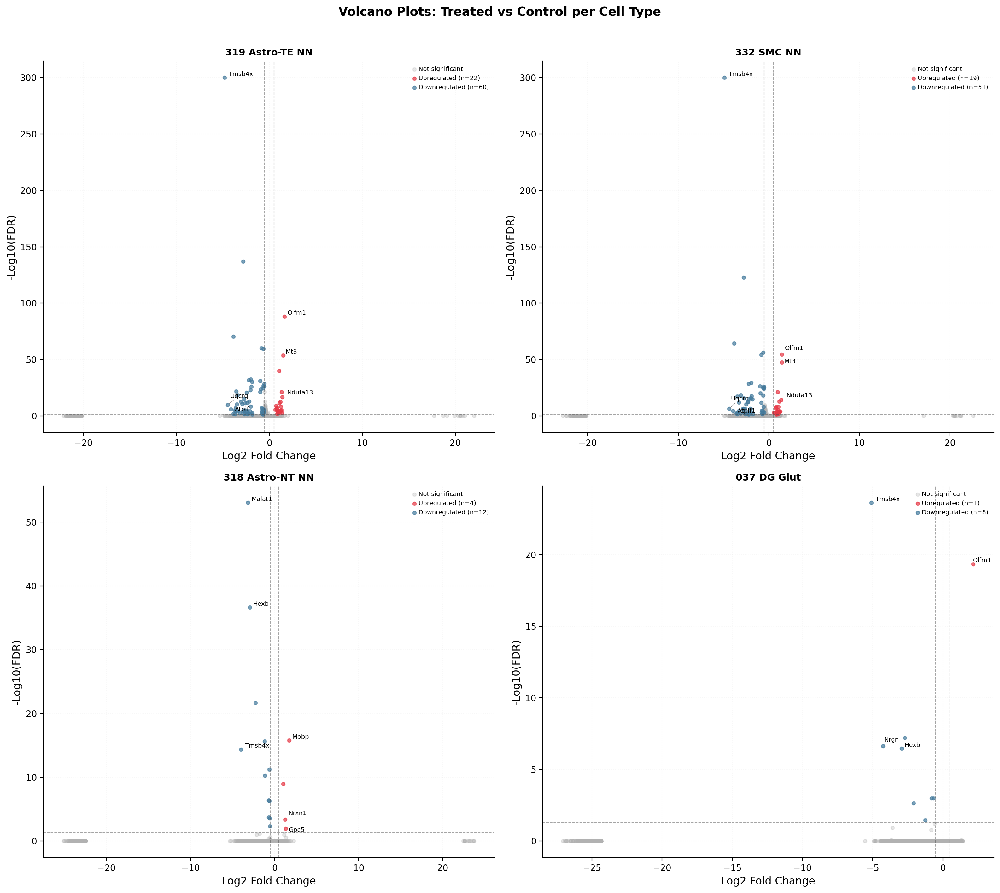

In [23]:
# Volcano plots for top cell types (by total DEGs)
from adjustText import adjust_text

top_ct_for_volcano = deg_summary_df.head(4)['cell_type'].tolist()
n_panels = len(top_ct_for_volcano)

if n_panels > 0:
    ncols = min(n_panels, 2)
    nrows = (n_panels + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 7 * nrows))
    if n_panels == 1:
        axes = np.array([axes])
    axes = np.atleast_2d(axes)

    for i, ct in enumerate(top_ct_for_volcano):
        r, c = divmod(i, ncols)
        ax = axes[r, c]
        df = all_deg_results[ct]

        for reg, color, alpha in [
            ('Not significant', COLORS['neutral'], 0.3),
            ('Upregulated', COLORS['upregulated'], 0.7),
            ('Downregulated', COLORS['downregulated'], 0.7)
        ]:
            sub = df[df['regulation'] == reg]
            n = len(sub)
            label = f'{reg} (n={n})' if reg != 'Not significant' else reg
            ax.scatter(sub['logfoldchanges'], sub['-log10_pval'],
                      c=color, s=15, alpha=alpha, label=label)

        ax.axhline(y=-np.log10(pval_threshold), color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)
        ax.axvline(x=logfc_threshold, color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)
        ax.axvline(x=-logfc_threshold, color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)

        # Label top genes
        top_genes = pd.concat([
            df[df['regulation'] == 'Upregulated'].nlargest(3, 'logfoldchanges'),
            df[df['regulation'] == 'Downregulated'].nsmallest(3, 'logfoldchanges')
        ])
        if len(top_genes) > 0:
            texts = [ax.text(row['logfoldchanges'], row['-log10_pval'],
                           row['names'], fontsize=7)
                    for _, row in top_genes.iterrows()]
            adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

        ax.set_xlabel('Log2 Fold Change')
        ax.set_ylabel('-Log10(FDR)')
        ax.set_title(ct, fontweight='bold', fontsize=11)
        ax.legend(fontsize=7, loc='upper right')
        ax.grid(True, alpha=0.15, linestyle=':')

    # Hide unused axes
    for i in range(n_panels, nrows * ncols):
        r, c = divmod(i, ncols)
        axes[r, c].set_visible(False)

    fig.suptitle('Volcano Plots: Treated vs Control per Cell Type', fontweight='bold', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

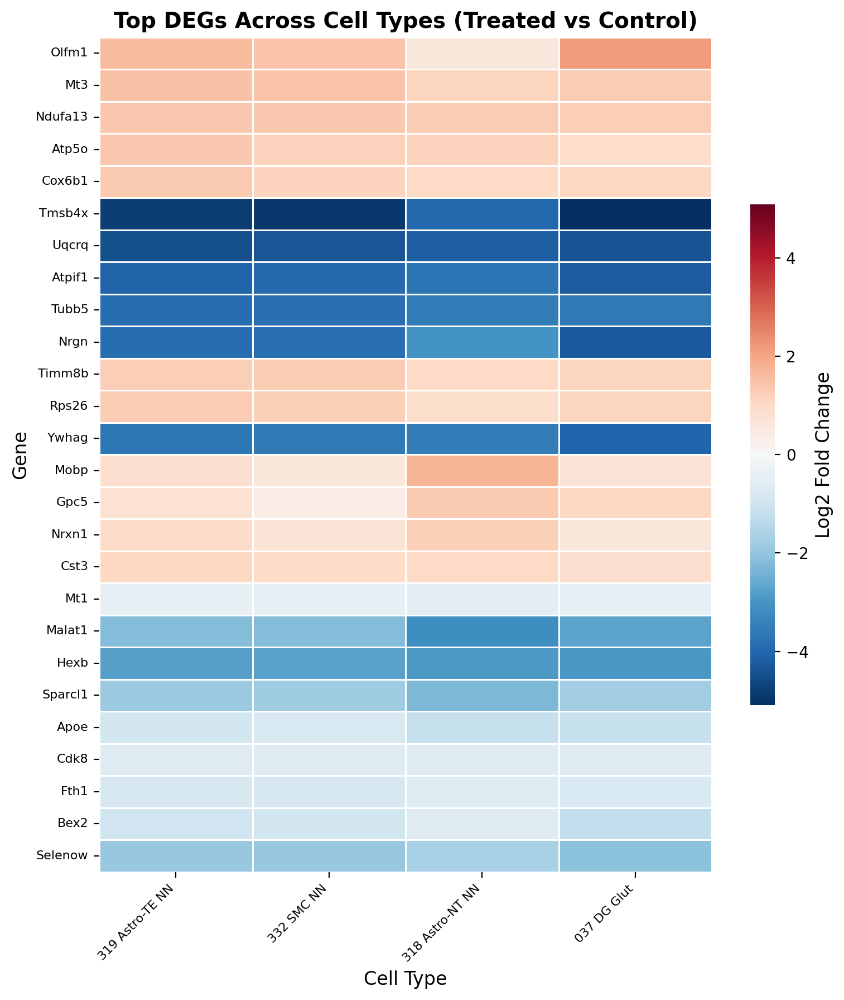

In [24]:
# Cross-cell-type DEG heatmap: top shared DEGs
# Collect top DEGs across cell types
top_genes_per_ct = []
for ct, df in all_deg_results.items():
    sig = df[df['regulation'] != 'Not significant']
    top = sig.nlargest(5, 'logfoldchanges')['names'].tolist() + \
          sig.nsmallest(5, 'logfoldchanges')['names'].tolist()
    top_genes_per_ct.extend(top)

# Get unique top genes
unique_top_genes = list(dict.fromkeys(top_genes_per_ct))[:30]

if len(unique_top_genes) > 0 and len(all_deg_results) > 1:
    # Build logFC matrix
    logfc_matrix = pd.DataFrame(index=unique_top_genes)
    for ct, df in all_deg_results.items():
        df_idx = df.set_index('names')
        logfc_matrix[ct] = df_idx.reindex(unique_top_genes)['logfoldchanges']

    logfc_matrix = logfc_matrix.dropna(how='all')
    logfc_matrix = logfc_matrix.fillna(0)

    fig, ax = plt.subplots(figsize=(max(8, len(all_deg_results) * 1.2),
                                     max(6, len(logfc_matrix) * 0.35)))

    vmax = np.abs(logfc_matrix.values).max()
    sns.heatmap(logfc_matrix, cmap='RdBu_r', center=0, vmin=-vmax, vmax=vmax,
                ax=ax, linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Log2 Fold Change', 'shrink': 0.6})

    ax.set_title('Top DEGs Across Cell Types (Treated vs Control)', fontweight='bold')
    ax.set_xlabel('Cell Type')
    ax.set_ylabel('Gene')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)

    plt.tight_layout()
    plt.show()

## 6. Gene Set Enrichment Analysis (GSEA) per Cell Type

GSEA with KEGG pathways identifies biological processes affected by treatment within each cell type.

In [25]:
# GSEA per cell type using KEGG pathways
# Try multiple KEGG library names (availability varies by gseapy version)
kegg_libs = ['KEGG_2019_Mouse', 'KEGG_2021_Mouse', 'KEGG_2016']
kegg_lib = None

# Find which KEGG library is available
for lib in kegg_libs:
    try:
        test_genes = all_deg_results[list(all_deg_results.keys())[0]]
        test_rnk = test_genes.set_index('names')['logfoldchanges'].sort_values(ascending=False)
        test_rnk = test_rnk[~test_rnk.index.duplicated(keep='first')]
        _ = gp.prerank(rnk=test_rnk.head(100), gene_sets=lib,
                       processes=1, permutation_num=10, outdir=None, verbose=False)
        kegg_lib = lib
        print(f"Using gene set library: {kegg_lib}")
        break
    except Exception:
        continue

if kegg_lib is None:
    # Download KEGG mouse pathways directly from Enrichr as fallback
    print("No pre-built KEGG library found, downloading from Enrichr...")
    try:
        kegg_lib = gp.get_library_name(organism='Mouse')
        kegg_lib = [x for x in kegg_lib if 'KEGG' in x][0]
        print(f"Found: {kegg_lib}")
    except Exception:
        print("Could not find any KEGG library. GSEA will be skipped.")

# Run GSEA for each cell type
all_gsea_results = {}

if kegg_lib:
    for ct, df in all_deg_results.items():
        # Rank genes by log fold change
        gene_list = df.set_index('names')['logfoldchanges'].sort_values(ascending=False)
        gene_list = gene_list[~gene_list.index.duplicated(keep='first')]

        try:
            gsea_res = gp.prerank(
                rnk=gene_list,
                gene_sets=kegg_lib,
                processes=1,
                permutation_num=100,
                outdir=None,
                format='png',
                seed=42,
                verbose=False
            )

            gsea_df = gsea_res.res2d.copy()
            gsea_df['cell_type'] = ct
            all_gsea_results[ct] = gsea_df

            n_sig = (gsea_df['FDR q-val'] < 0.25).sum()
            print(f"  {ct}: {len(gsea_df)} pathways, {n_sig} significant (FDR < 0.25)")

        except Exception as e:
            print(f"  {ct}: GSEA failed - {e}")

print(f"\nGSEA complete for {len(all_gsea_results)} cell types")

2026-02-22 00:52:27,685 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-02-22 00:52:27,685 [ERROR] The first entry of your gene_sets (gmt) look like this : { ABC transporters: [ABCG8, ABCC4, ABCA2, ABCA3, ABCC5, ABCC2, ABCA1, ABCC3, ABCC8, ABCA8B, ABCA6, ABCC9, ABCA7, ABCA4, ABCC6, ABCA5, TAP2, TAP1, ABCA8A, ABCA9, ABCB10, ABCB11, ABCC10, ABCA12, ABCG1, ABCG4, ABCC1, ABCG5, ABCG2, CFTR, ABCG3, ABCB4, ABCD3, ABCD4, ABCB1A, ABCB7, ABCB8, ABCB5, ABCB6, ABCA17, ABCB9, ABCA13, ABCC12, ABCA14, DEFB1, ABCB1B, ABCD1, ABCD2]}
2026-02-22 00:52:27,686 [ERROR] The first 5 genes look like this : [ Ube2s, Klk8, Fam89a, 1700010J16Rik, Prss27 ]
2026-02-22 00:52:27,897 [ERROR] No supported gene_sets: KEGG_2021_Mouse
2026-02-22 00:52:29,604 [ERROR] No gene sets passed through filtering condition !!! 
H

No pre-built KEGG library found, downloading from Enrichr...
Found: KEGG_2013


2026-02-22 00:52:29,815 [WARNING] Duplicated values found in preranked stats: 2.96% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-02-22 00:52:31,806 [WARNING] Duplicated values found in preranked stats: 5.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  319 Astro-TE NN: 132 pathways, 0 significant (FDR < 0.25)


2026-02-22 00:52:32,856 [WARNING] Duplicated values found in preranked stats: 17.89% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  332 SMC NN: 132 pathways, 0 significant (FDR < 0.25)


2026-02-22 00:52:33,896 [WARNING] Duplicated values found in preranked stats: 40.47% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  318 Astro-NT NN: 132 pathways, 1 significant (FDR < 0.25)
  037 DG Glut: 132 pathways, 3 significant (FDR < 0.25)

GSEA complete for 4 cell types


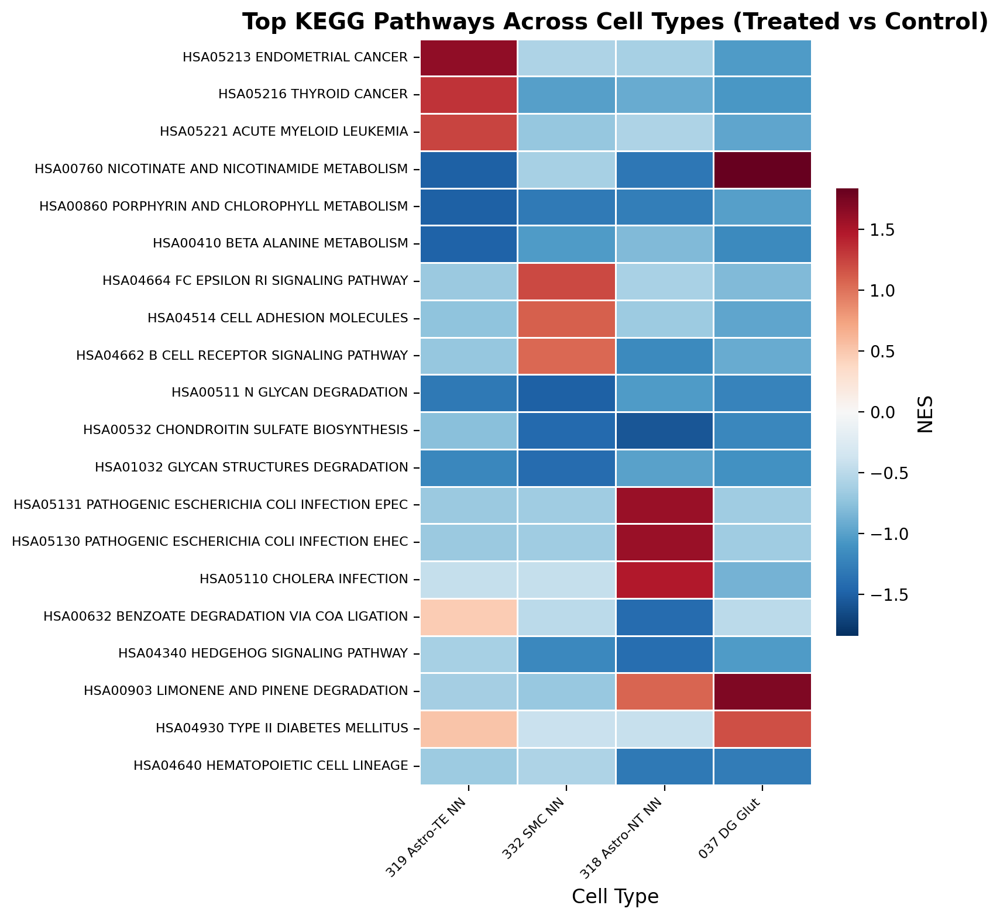

In [26]:
# GSEA visualization: top pathways across cell types
if len(all_gsea_results) > 0:
    # Ensure numeric columns (gseapy sometimes returns strings)
    for ct in all_gsea_results:
        all_gsea_results[ct]['NES'] = pd.to_numeric(all_gsea_results[ct]['NES'], errors='coerce')
        all_gsea_results[ct]['FDR q-val'] = pd.to_numeric(all_gsea_results[ct]['FDR q-val'], errors='coerce')

    # Collect top pathways per cell type
    top_pathways_list = []
    for ct, df in all_gsea_results.items():
        top_up = df.nlargest(3, 'NES')[['Term', 'NES', 'FDR q-val']].copy()
        top_down = df.nsmallest(3, 'NES')[['Term', 'NES', 'FDR q-val']].copy()
        combined = pd.concat([top_up, top_down])
        combined['cell_type'] = ct
        top_pathways_list.append(combined)

    top_pathways_all = pd.concat(top_pathways_list)

    # Get unique pathways
    unique_pathways = top_pathways_all['Term'].unique()[:20]

    # Build NES matrix
    nes_matrix = pd.DataFrame(index=unique_pathways)
    for ct, df in all_gsea_results.items():
        df_idx = df.set_index('Term')
        nes_matrix[ct] = df_idx.reindex(unique_pathways)['NES']

    nes_matrix = nes_matrix.fillna(0)

    fig, ax = plt.subplots(figsize=(max(8, len(all_gsea_results) * 1.5),
                                     max(6, len(nes_matrix) * 0.4)))

    vmax = np.abs(nes_matrix.values).max()
    sns.heatmap(nes_matrix, cmap='RdBu_r', center=0, vmin=-vmax, vmax=vmax,
                ax=ax, linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'NES', 'shrink': 0.6})

    ax.set_title('Top KEGG Pathways Across Cell Types (Treated vs Control)', fontweight='bold')
    ax.set_xlabel('Cell Type')
    ax.set_ylabel('')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)

    plt.tight_layout()
    plt.show()

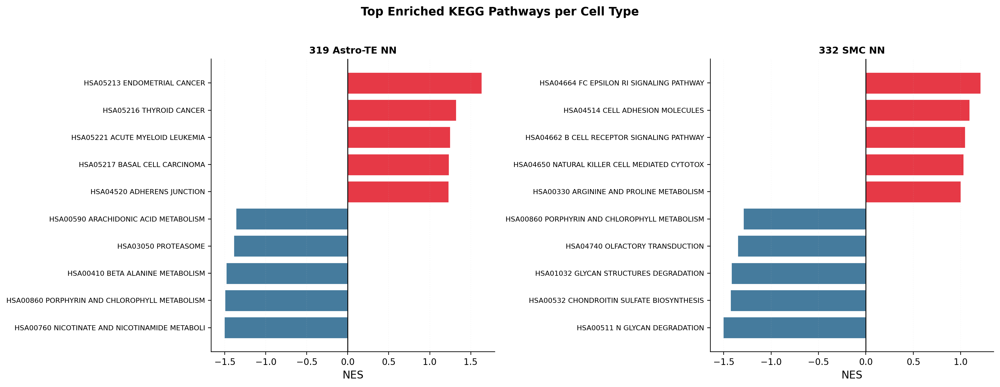

In [27]:
# Per cell type GSEA bar plots for top 2 cell types by DEGs
top_ct_for_gsea = deg_summary_df.head(2)['cell_type'].tolist()
top_ct_for_gsea = [ct for ct in top_ct_for_gsea if ct in all_gsea_results]

if len(top_ct_for_gsea) > 0:
    fig, axes = plt.subplots(1, len(top_ct_for_gsea),
                            figsize=(8 * len(top_ct_for_gsea), 6))
    if len(top_ct_for_gsea) == 1:
        axes = [axes]

    for ax, ct in zip(axes, top_ct_for_gsea):
        df = all_gsea_results[ct].copy()
        df['NES'] = pd.to_numeric(df['NES'], errors='coerce')
        df = df.dropna(subset=['NES'])
        # Top 5 up and down by NES
        top = pd.concat([df.nlargest(5, 'NES'), df.nsmallest(5, 'NES')])
        top = top.sort_values('NES')

        colors = [COLORS['upregulated'] if x > 0 else COLORS['downregulated']
                  for x in top['NES']]

        ax.barh(range(len(top)), top['NES'], color=colors,
                edgecolor='white', linewidth=1)
        ax.set_yticks(range(len(top)))
        ax.set_yticklabels([t[:45] for t in top['Term']], fontsize=8)
        ax.set_xlabel('NES')
        ax.set_title(f'{ct}', fontweight='bold', fontsize=11)
        ax.axvline(x=0, color='black', linewidth=1)
        ax.grid(True, alpha=0.15, axis='x', linestyle=':')

    fig.suptitle('Top Enriched KEGG Pathways per Cell Type', fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

## 7. Cell Type Proportion Comparison

Analyze whether treatment affects the relative abundance of different cell types.

In [28]:
# --- Cell type proportion comparison ---
from scipy.stats import chi2_contingency, fisher_exact
from statsmodels.stats.multitest import multipletests

# Count cells per type per condition
ct_counts = pd.crosstab(adata_combined.obs['cell_type'], adata_combined.obs['condition'])

# Convert to percentages
ct_props = ct_counts.div(ct_counts.sum(axis=0), axis=1) * 100
ct_props['Difference'] = ct_props['Treated'] - ct_props['Control']

# Global test: are proportions different between conditions?
chi2, pval, dof, _ = chi2_contingency(ct_counts)
print(f"Chi-square test (overall): chi2={chi2:.2f}, p={pval:.2e}")

# Per-cell-type: Fisher's exact test with FDR correction
fisher_results = []
for ct in ct_counts.index:
    ct_in = ct_counts.loc[ct].values
    ct_out = ct_counts.sum(axis=0).values - ct_in
    contingency = np.array([ct_in, ct_out])
    oddsratio, pval_f = fisher_exact(contingency.T)
    fisher_results.append({
        'cell_type': ct, 'odds_ratio': oddsratio, 'p_value': pval_f,
        'control_prop': ct_props.loc[ct, 'Control'],
        'treated_prop': ct_props.loc[ct, 'Treated'],
        'difference': ct_props.loc[ct, 'Difference']
    })

fisher_df = pd.DataFrame(fisher_results)
fisher_df['p_adj'] = multipletests(fisher_df['p_value'], method='fdr_bh')[1]
fisher_df = fisher_df.sort_values('p_adj')

print(f"\nProportion changes:")
print(fisher_df[['cell_type', 'control_prop', 'treated_prop', 'difference', 'p_adj']].to_string(index=False))

Chi-square test (overall): chi2=0.37, p=9.99e-01

Proportion changes:
             cell_type  control_prop  treated_prop  difference  p_adj
           037 DG Glut      2.511652      2.346130   -0.165522    1.0
045 OB-STR-CTX Inh IMN      0.258933      0.243754   -0.015179    1.0
       318 Astro-NT NN      8.803729      8.744668   -0.059061    1.0
       319 Astro-TE NN     44.484723     44.911639    0.426916    1.0
           331 Peri NN      0.336613      0.335161   -0.001452    1.0
            332 SMC NN     43.241844     43.022547   -0.219296    1.0
       338 Lymphoid NN      0.362506      0.396100    0.033593    1.0


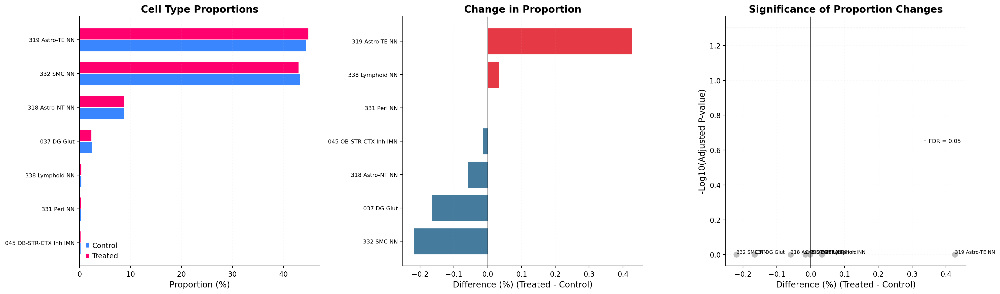

In [29]:
# Proportion comparison visualization
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 1. Side-by-side bar chart
plot_props = ct_props[['Control', 'Treated']].sort_values('Control', ascending=True)
y_pos = range(len(plot_props))
bar_height = 0.35

axes[0].barh([y - bar_height/2 for y in y_pos], plot_props['Control'],
            bar_height, color=COLORS['control'], label='Control', edgecolor='white')
axes[0].barh([y + bar_height/2 for y in y_pos], plot_props['Treated'],
            bar_height, color=COLORS['treated'], label='Treated', edgecolor='white')
axes[0].set_yticks(y_pos)
axes[0].set_yticklabels(plot_props.index, fontsize=8)
axes[0].set_xlabel('Proportion (%)')
axes[0].set_title('Cell Type Proportions', fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.15, axis='x', linestyle=':')

# 2. Difference plot
diff_sorted = ct_props['Difference'].sort_values()
colors_diff = [COLORS['upregulated'] if x > 0 else COLORS['downregulated'] for x in diff_sorted]

axes[1].barh(range(len(diff_sorted)), diff_sorted, color=colors_diff,
            edgecolor='white', linewidth=1)
axes[1].set_yticks(range(len(diff_sorted)))
axes[1].set_yticklabels(diff_sorted.index, fontsize=8)
axes[1].axvline(x=0, color='black', linewidth=1)
axes[1].set_xlabel('Difference (%) (Treated - Control)')
axes[1].set_title('Change in Proportion', fontweight='bold')
axes[1].grid(True, alpha=0.15, axis='x', linestyle=':')

# 3. Statistical significance
fisher_df['-log10_pval'] = -np.log10(fisher_df['p_adj'] + 1e-10)
colors_vol = []
for _, row in fisher_df.iterrows():
    if row['p_adj'] < 0.05:
        colors_vol.append(COLORS['upregulated'] if row['difference'] > 0 else COLORS['downregulated'])
    else:
        colors_vol.append(COLORS['neutral'])

axes[2].scatter(fisher_df['difference'], fisher_df['-log10_pval'],
              c=colors_vol, s=80, alpha=0.8, edgecolors='white', linewidths=0.5)
axes[2].axhline(y=-np.log10(0.05), color=COLORS['dark_gray'],
              linestyle='--', linewidth=0.8, alpha=0.5, label='FDR = 0.05')
axes[2].axvline(x=0, color='black', linewidth=0.8)

for _, row in fisher_df.iterrows():
    axes[2].annotate(row['cell_type'][:20], (row['difference'], row['-log10_pval']),
                    fontsize=7, ha='left', va='bottom')

axes[2].set_xlabel('Difference (%) (Treated - Control)')
axes[2].set_ylabel('-Log10(Adjusted P-value)')
axes[2].set_title('Significance of Proportion Changes', fontweight='bold')
axes[2].legend(fontsize=8)
axes[2].grid(True, alpha=0.15, linestyle=':')

plt.tight_layout()
plt.show()

## 8. Spatial Visualization of Treatment Effects

Visualize how treatment affects gene expression in spatial context for the top DEGs across cell types.

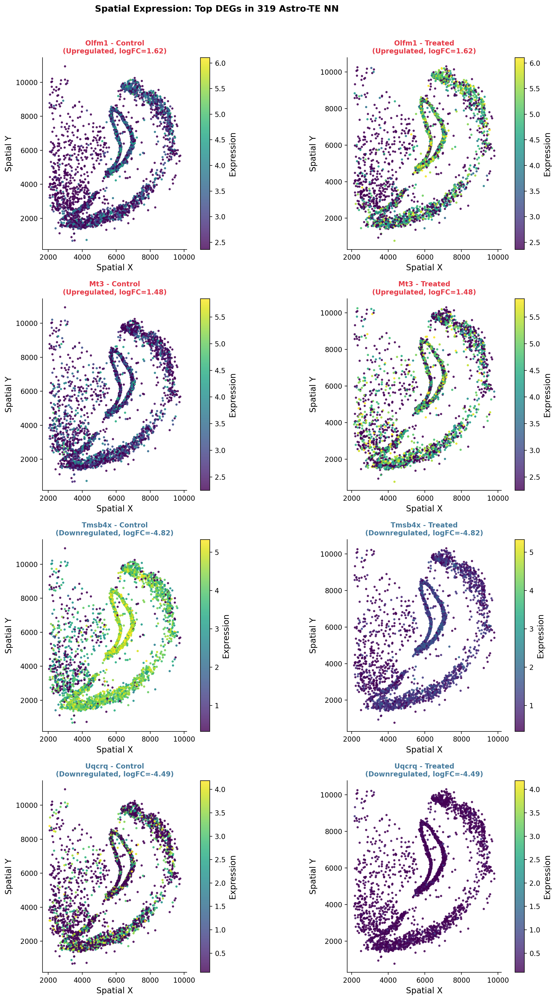

In [30]:
# Select top DEGs from the cell type with most DEGs
top_ct = deg_summary_df.iloc[0]['cell_type']
top_df = all_deg_results[top_ct]

top_up_genes = top_df[top_df['regulation'] == 'Upregulated'].nlargest(2, 'logfoldchanges')['names'].tolist()
top_down_genes = top_df[top_df['regulation'] == 'Downregulated'].nsmallest(2, 'logfoldchanges')['names'].tolist()
spatial_genes = (top_up_genes + top_down_genes)[:4]

if len(spatial_genes) > 0:
    fig, axes = plt.subplots(len(spatial_genes), 2, figsize=(14, 5 * len(spatial_genes)))
    if len(spatial_genes) == 1:
        axes = axes.reshape(1, -1)

    for row_idx, gene in enumerate(spatial_genes):
        if gene not in adata_combined.raw.var_names:
            continue

        gene_idx = adata_combined.raw.var_names.get_loc(gene)
        expr = adata_combined.raw.X[:, gene_idx]
        if issparse(expr):
            expr = expr.toarray().flatten()

        logfc = top_df[top_df['names'] == gene]['logfoldchanges'].values[0]
        reg = top_df[top_df['names'] == gene]['regulation'].values[0]
        color = COLORS['upregulated'] if reg == 'Upregulated' else COLORS['downregulated']

        # Shared colorbar range
        vmin, vmax = np.percentile(expr[expr > 0], [2, 98]) if (expr > 0).sum() > 10 else (0, 1)

        for col_idx, cond in enumerate(['Control', 'Treated']):
            mask = adata_combined.obs['condition'] == cond
            coords = adata_combined.obsm['spatial'][mask]

            sc_plot = axes[row_idx, col_idx].scatter(
                coords[:, 0], coords[:, 1],
                c=expr[mask], cmap='viridis', s=5, alpha=0.8,
                vmin=vmin, vmax=vmax)

            axes[row_idx, col_idx].set_title(
                f'{gene} - {cond}\n({reg}, logFC={logfc:.2f})',
                fontweight='bold', fontsize=10, color=color)
            axes[row_idx, col_idx].set_aspect('equal')
            axes[row_idx, col_idx].set_xlabel('Spatial X')
            axes[row_idx, col_idx].set_ylabel('Spatial Y')
            plt.colorbar(sc_plot, ax=axes[row_idx, col_idx],
                        label='Expression', fraction=0.046, pad=0.04)

    fig.suptitle(f'Spatial Expression: Top DEGs in {top_ct}', fontweight='bold', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

## 9. Summary and Export

In [31]:
# ============================================================
# ANALYSIS SUMMARY
# ============================================================
print("=" * 80)
print("ANALYSIS SUMMARY")
print("=" * 80)

print(f"\n1. DATA")
print(f"   Healthy control: {adata_control.n_obs:,} spots")
print(f"   Cancerous (mock): {adata_treated.n_obs:,} spots")
print(f"   Combined (after QC): {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")

print(f"\n2. CELL TYPE ANNOTATION (CellTypist - Mouse_Whole_Brain.pkl)")
print(f"   Distinct cell types: {adata_combined.obs['majority_voting'].nunique()}")
print(f"   Categories plotted: {len(cell_types_unique)}")

print(f"\n3. DIFFERENTIAL EXPRESSION (per cell type, Cancerous vs Control)")
for _, row in deg_summary_df.iterrows():
    print(f"   {row['cell_type']}: {row['n_up']} up, {row['n_down']} down")

print(f"\n4. GSEA (per cell type)")
if all_gsea_results:
    for ct, df in all_gsea_results.items():
        n_sig = (df['FDR q-val'] < 0.25).sum()
        print(f"   {ct}: {n_sig} significant pathways")
else:
    print("   No GSEA results (gene set library not available)")

print(f"\n5. PROPORTION CHANGES")
sig_props = fisher_df[fisher_df['p_adj'] < 0.05]
print(f"   Significantly changed cell types: {len(sig_props)}")

print("\n" + "=" * 80)

ANALYSIS SUMMARY

1. DATA
   Healthy control: 4,000 spots
   Cancerous (mock): 3,400 spots
   Combined (after QC): 7,144 spots, 15,413 genes

2. CELL TYPE ANNOTATION (CellTypist - Mouse_Whole_Brain.pkl)
   Distinct cell types: 7
   Categories plotted: 7

3. DIFFERENTIAL EXPRESSION (per cell type, Cancerous vs Control)
   319 Astro-TE NN: 22 up, 60 down
   332 SMC NN: 19 up, 51 down
   318 Astro-NT NN: 4 up, 12 down
   037 DG Glut: 1 up, 8 down

4. GSEA (per cell type)
   319 Astro-TE NN: 0 significant pathways
   332 SMC NN: 0 significant pathways
   318 Astro-NT NN: 1 significant pathways
   037 DG Glut: 3 significant pathways

5. PROPORTION CHANGES
   Significantly changed cell types: 0



In [32]:
# --- Export all results ---
results_dir = 'integration_results/'
os.makedirs(results_dir, exist_ok=True)

# Save the full integrated AnnData object
output_path = 'adult_mouse_brain_ST4k_integrated.h5ad'
adata_combined.write(output_path)
print(f"Integrated data: {output_path}")

# Save per-cell-type DEG tables
all_degs = pd.concat(all_deg_results.values(), ignore_index=True)
all_degs.to_csv(f"{results_dir}deg_per_cell_type.csv", index=False)
print(f"DEG results: {results_dir}deg_per_cell_type.csv")

# Save GSEA results (if available)
if all_gsea_results:
    all_gsea = pd.concat(all_gsea_results.values(), ignore_index=True)
    all_gsea.to_csv(f"{results_dir}gsea_per_cell_type.csv", index=False)
    print(f"GSEA results: {results_dir}gsea_per_cell_type.csv")

# Save proportion analysis
ct_props.to_csv(f"{results_dir}cell_type_proportions.csv")
fisher_df.to_csv(f"{results_dir}proportion_tests.csv", index=False)
print(f"Proportions: {results_dir}cell_type_proportions.csv")

print("\nAll results exported.")

Integrated data: adult_mouse_brain_ST4k_integrated.h5ad
DEG results: integration_results/deg_per_cell_type.csv
GSEA results: integration_results/gsea_per_cell_type.csv
Proportions: integration_results/cell_type_proportions.csv

All results exported.
